# Lenia: The continuous cellular automaton

In [1]:
# Import necessary libraries

import numpy as np
import scipy
import scipy.signal
import matplotlib.pylab as plt
import matplotlib.animation
import IPython.display

# Define helper functions and global variables
def figure_world(A, cmap="plasma", name="World Field"):
    global img
    fig = plt.figure()
    img = plt.imshow(A, cmap=cmap, interpolation="nearest", vmin=0)
    plt.title(name)
    plt.close()
    return fig

def figure_asset(K, growth, cmap="inferno", K_sum=1, bar_K=False):
    global R
    K_size = K.shape[0]
    K_mid = K_size // 2
    fig, ax = plt.subplots(1, 3, figsize=(14, 2), gridspec_kw={
                            "width_ratios": [1, 1, 2]})
    ax[0].imshow(K, cmap=cmap, interpolation="nearest", vmin=0)
    ax[0].title.set_text("kernel K")
    if bar_K:
        ax[1].bar(range(K_size), K[K_mid, :], width=1)
    else:
        ax[1].plot(range(K_size), K[K_mid, :])
    ax[1].title.set_text("K cross-section")
    ax[1].set_xlim([K_mid - R - 3, K_mid + R + 3])
    if K_sum <= 1:
        x = np.linspace(0, K_sum, 1000)
        ax[2].plot(x, growth(x))
    else:
        x = np.arange(K_sum + 1)
        ax[2].step(x, growth(x))
    ax[2].axhline(y=0, color="grey", linestyle="dotted")
    ax[2].title.set_text("growth G")
    return fig

## Background of Lenia

The inspiration of Lenia is to extend cellular automation into a generalized pattern of cellular automaton simulation. Through multiple iterations of the cellular automaton implementations, more features are constantly being added. The overall goal is to create a simulation that better represents the "organic" digital lifeforms by applying a few simple rules. In this section, we will discuss a handful of iterations of cellular automaton traced back to 1970 up to the current establishment of Lenia.

### Convey's Game of Life

The most iconic and perhaps the most famous iteration of the cellular automaton is Convey's Game of Life developed by  John Horton Conway in 1970. The concept of the simulation is very straightforward. Considering a 2-D space of a finite size,  which we will refer to as "field,"  Each of the cells (distinct integer coordinates) in the field could represent two possible scenarios: 1) if the value is 0, the cell represents a "dead" cell 2) if the value is 1, the cell represents a "alive" cell.  Then, in the next time step or the next frame, we update the value of every cell as follows:

- If the cell is currently alive (1), it stays alive if there are 2 or 3 alive neighbors; otherwise, it becomes dead (0).
- If the cell is currently dead (0), it becomes alive if it has exactly 3 alive neighbors; otherwise, it stays dead (0).

The overall idea of the rules above is to simulate some forms of reproduction within close proximity and death due to overpopulation or isolation.

The modified version [Python snippet by Jake VanderPlas](http://jakevdp.github.io/blog/2013/08/07/conways-game-of-life/) below illustrate how this idea can be simply implemented!

In [2]:
# Create a 64 by 64 field of random values in of 0 and 1
A = np.random.randint(2, size=(64, 64))

# Update every cell in the field based on the conditions of its neighbors
def update(i):
    global A
    """ neighbor sum """
    U = sum(np.roll(A, (i, j), axis=(0, 1)) for i in (-1, 0, +1)
            for j in (-1, 0, +1) if (i != 0 or j != 0))
    """ conditional update """
    A = (A & (U == 2)) | (U == 3)
    img.set_array(A)
    return img

# Display the field over 60 time steps at 10 fps 
fig = figure_world(A, cmap="binary", name="Conway's Game of Life")
IPython.display.HTML(matplotlib.animation.FuncAnimation(
    fig, update, frames=60, interval=100).to_jshtml())

As the simulation progresses, many distinct patterns often referred to as "species" could be observed. We could see some stable stationary species like the 2x2 square or the flickering diamond. You might also notice some moving species which have the nickname "gliders" going across the field as well. However, Convey's game of life nonetheless limits the encoding of "alive" and "dead" with binary values which one argues most likely does not represent physical life. This, then, leads to a more generalized iteration of cellular automaton called the "Smooth Life" which we will discuss further.

### Convolution and Growth Function

Before moving on to discussing the other iteration of cellular automaton, it is beneficial to discuss how Convey's ideas could be generalized using convolution and growth function mapping. As explained prior each cell in the field will be updated based on its neighbors, this step could be encoded concisely with matrix convolution such that each cell of the resulting matrix is the result of some arithmetic operation of its neighboring cells. 

In the case of Convey's Game of Life, the matrix that encodes the rule is simply a 3x3 square containing 1 in every cell except the center cell; in other words, we are taking into account every immediate surrounding cell but not the cell itself. To also apply the conditional update on the cell, we define a piece-wise growth function that reflects on the 2 rules explained in Convey's Game of Life section. You should notice that the growth function maps to mainly 0 except in the case that we have some close neighboring cells. Then, the final step is to add back the result of the convolution that has been mapped by the growth function back to the original field. However, we have to clip the cell value to be between 0 and 1: the fully "alive" cell cannot be more "alive" (to have a value > 1).

The Python snippet below from [Lenia-Tutorial](https://github.com/OpenLenia/Lenia-Tutorial) shows how Convey's Game of Life can be 
implemented also using convolution and growth function.

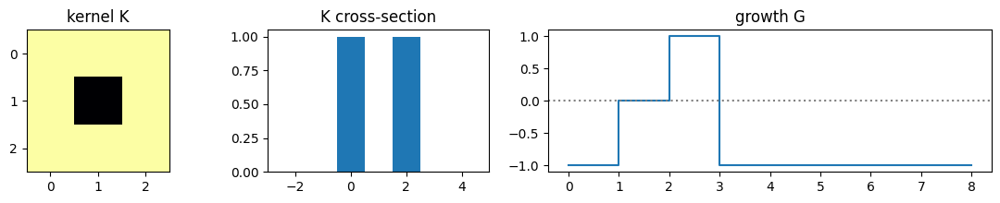

In [3]:
# Create a 64 by 64 field of random values in of 0 and 1
A = np.random.randint(2, size=(64, 64))

""" Square kernel of size 3x3 """
R = 1
K = np.asarray([[1,1,1], [1,0,1], [1,1,1]])
K_sum = np.sum(K)

""" Growth function that encodes the rules of Convey's Game of Life """
def growth(U):
    return 0 + (U==3) - ((U<2)|(U>3))

# Update every cell in the field using convolution and growth function
def update(i):
    global A
    U = scipy.signal.convolve2d(A, K, mode="same", boundary="wrap")
    # incrementally update the field and clip values between 0 and 1
    A = np.clip(A + growth(U), 0, 1)
    img.set_array(A)
    return img

# Plot the kernel K and growth function G
figure_asset(K, growth, K_sum=K_sum, bar_K=True)

# Display the field over 60 time steps at 10 fps
fig = figure_world(A, cmap="binary", name="Conway's Game of Life")
IPython.display.HTML(matplotlib.animation.FuncAnimation(
    fig, update, frames=60, interval=100).to_jshtml())

### Smooth Life

Smooth Life extends the capability of Convey's Game of Life by changing how we interpret the "liveliness" of the cellular automaton Rather than assigning to be merely "dead (0)" or "alive (1)," Smooth Life allows each cell to have a "liveliness" spectrum ranging from 0 to 1. The major change of interpretation allows for much more smooth lifeforms to emerge. Also, Smooth Life redefines the kernel to be in a ring-lie structure to better represent the physical system. To further explain, each cell's livelihood in Smooth Life depends on the neighboring cells that are within a definite radius; this allows the cluster of cells to emerge which we have not seen in Convey's Game of Life. The last but arguably most innovative feature of Smooth Life is the non-linear growth function. In simple terms, Smooth Life asserts that the closer the neighbor cells are, the more influential they are to determine the livelihood of the center cell. This last piece of adjustment makes the Smooth Life to much closer resembling the biological life we observe naturally.

The Python snippet below from [Lenia-Tutorial](https://github.com/OpenLenia/Lenia-Tutorial) shows how Smooth Life can be implemented.

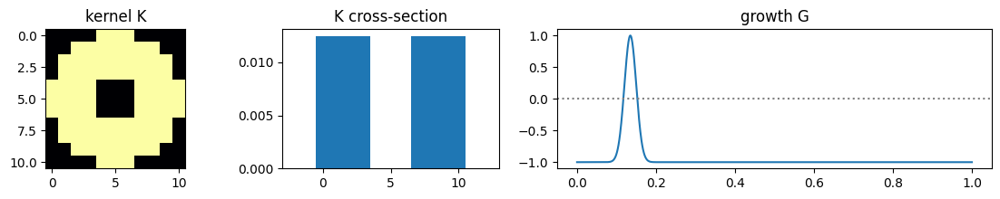

In [4]:
size = 128
T = 10
A = np.random.rand(size, size)

""" Ring-like kernel of radius 5 """
R = 5
K = np.asarray([
    [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0],
    [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0],
    [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0],
    [1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
    [1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
    [1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1],
    [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0],
    [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0],
    [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0]])
K = K / np.sum(K)

""" Bell-shaped Gaussian function """
def bell(x, m, s): return np.exp(-((x-m)/s)**2 / 2)

def growth(U):
    m = 0.135
    s = 0.015
    return bell(U, m, s)*2-1

# Update every cell in the field using convolution and growth function
def update(i):
    global A, img
    U = scipy.signal.convolve2d(A, K, mode="same", boundary="wrap")
    A = np.clip(A + 1/T * growth(U), 0, 1)
    img.set_array(A)
    return img

# Plot the kernel K and growth function G and display the field over 100 time steps at 10 fps
figure_asset(K, growth, bar_K=True)
fig = figure_world(A, name="Smooth Life")
IPython.display.HTML(matplotlib.animation.FuncAnimation(
    fig, update, frames=60, interval=100).to_jshtml())

## Lenia

Lenia gets the inspiration from Smooth Life and takes a step further by also allowing the kernel to be of any functional form aka. smooth kernel. The core elements of Lenia are the field, kernel, and growth function. In his article, Bert Wang-Chak Chan summarizes the logic of any cellular automaton into a simple equation below:

$$ A^{t+\Delta t} = \Bigl[ A^t + \Delta t \ G(K * A^t) \Bigr]^1_0 $$

$ A^t $ represents the field at the current time step $t$  
$ \Delta t $ represents the interval between each time step  
$ G(X) $ represents the growth function  
$ K $ represents the kernel  
$ K * A^t $ represents the convolution between the kernel and the field  
$ \Bigl[ \ \Bigr]^1_0 $ represents that the value is clipped between 0 and 1  

The generalization of the algorithm allows Lenia to encode a diverse set of characteristics of a simulation by varying the kernel's and growth function's parameters.

The modified Python snippet below from [Lenia-Tutorial](https://github.com/OpenLenia/Lenia-Tutorial) shows how Lenia can be implemented.

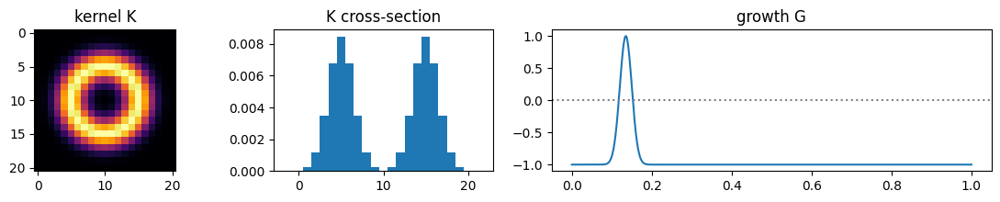

In [5]:
size = 128
T = 10
A = np.random.rand(size, size)

""" Ring-like kernel of radius 10 """
R = 10
A = np.random.rand(size, size)
D = np.zeros((2*R+1, 2*R+1))
for r in range(2*R+1):
    for c in range(2*R+1):
        D[r][c] = np.sqrt((c - R)**2 + (r - R)**2) / R
K = (D < 1) * bell(D, 0.5, 0.15)
K = K / np.sum(K)

""" Bell-shaped Gaussian function """
def bell(x, m, s): return np.exp(-((x-m)/s)**2 / 2)

def growth(U):
    m = 0.135
    s = 0.015
    return bell(U, m, s)*2-1

# Update every cell in the field using convolution and growth function
def update(i):
    global A, img
    U = scipy.signal.convolve2d(A, K, mode="same", boundary="wrap")
    A = np.clip(A + 1/T * growth(U), 0, 1)
    img.set_array(A)
    return img

# Plot the kernel K and growth function G and display the field over 100 time steps at 10 fps
figure_asset(K, growth, bar_K=True)
fig = figure_world(A, name="Lenia")
IPython.display.HTML(matplotlib.animation.FuncAnimation(
    fig, update, frames=60, interval=100).to_jshtml())

With the kernel and growth function being smoothed out, the simulation of cellular automata illustrates the smooth and continuous behavior that one could argue closely resembles the "organic" life while all aspects of the simulation are deterministic except the randomly generated initial field. In the world of Lenia, many lifeforms often labeled as "species" have been discovered in Lenia.

The modified Python snippet below from [Lenia-Tutorial](https://github.com/OpenLenia/Lenia-Tutorial) shows an example of the "Orbium" which is one of most iconic glider in Lenia.

In [6]:
""" Pattern of the Orbium species """
pattern = {}
pattern["orbium"] = {"name":"Orbium","R":13,"T":10,"m":0.15,"s":0.015,"b":[1],
  "cells":[[0,0,0,0,0,0,0.1,0.14,0.1,0,0,0.03,0.03,0,0,0.3,0,0,0,0], [0,0,0,0,0,0.08,0.24,0.3,0.3,0.18,0.14,0.15,0.16,0.15,0.09,0.2,0,0,0,0], [0,0,0,0,0,0.15,0.34,0.44,0.46,0.38,0.18,0.14,0.11,0.13,0.19,0.18,0.45,0,0,0], [0,0,0,0,0.06,0.13,0.39,0.5,0.5,0.37,0.06,0,0,0,0.02,0.16,0.68,0,0,0], [0,0,0,0.11,0.17,0.17,0.33,0.4,0.38,0.28,0.14,0,0,0,0,0,0.18,0.42,0,0], [0,0,0.09,0.18,0.13,0.06,0.08,0.26,0.32,0.32,0.27,0,0,0,0,0,0,0.82,0,0], [0.27,0,0.16,0.12,0,0,0,0.25,0.38,0.44,0.45,0.34,0,0,0,0,0,0.22,0.17,0], [0,0.07,0.2,0.02,0,0,0,0.31,0.48,0.57,0.6,0.57,0,0,0,0,0,0,0.49,0], [0,0.59,0.19,0,0,0,0,0.2,0.57,0.69,0.76,0.76,0.49,0,0,0,0,0,0.36,0], [0,0.58,0.19,0,0,0,0,0,0.67,0.83,0.9,0.92,0.87,0.12,0,0,0,0,0.22,0.07], [0,0,0.46,0,0,0,0,0,0.7,0.93,1,1,1,0.61,0,0,0,0,0.18,0.11], [0,0,0.82,0,0,0,0,0,0.47,1,1,0.98,1,0.96,0.27,0,0,0,0.19,0.1], [0,0,0.46,0,0,0,0,0,0.25,1,1,0.84,0.92,0.97,0.54,0.14,0.04,0.1,0.21,0.05], [0,0,0,0.4,0,0,0,0,0.09,0.8,1,0.82,0.8,0.85,0.63,0.31,0.18,0.19,0.2,0.01], [0,0,0,0.36,0.1,0,0,0,0.05,0.54,0.86,0.79,0.74,0.72,0.6,0.39,0.28,0.24,0.13,0], [0,0,0,0.01,0.3,0.07,0,0,0.08,0.36,0.64,0.7,0.64,0.6,0.51,0.39,0.29,0.19,0.04,0], [0,0,0,0,0.1,0.24,0.14,0.1,0.15,0.29,0.45,0.53,0.52,0.46,0.4,0.31,0.21,0.08,0,0], [0,0,0,0,0,0.08,0.21,0.21,0.22,0.29,0.36,0.39,0.37,0.33,0.26,0.18,0.09,0,0,0], [0,0,0,0,0,0,0.03,0.13,0.19,0.22,0.24,0.24,0.23,0.18,0.13,0.05,0,0,0,0], [0,0,0,0,0,0,0,0,0.02,0.06,0.08,0.09,0.07,0.05,0.01,0,0,0,0,0]]
}

""" Scaling factor and initial position """
scale = 1  
cx, cy = 20, 20
""" Load pattern, including parameters R, T, m, s, and cells """
globals().update(pattern["orbium"])  # try changing the pattern to bosco, geminium, fish, aquarium, or wanderer
C = np.asarray(cells)

# Create an empty field of size 64x64
size = 64
A = np.zeros([size, size])

"""Pplace scaled pattern """
C = scipy.ndimage.zoom(C, scale, order=0)
R *= scale
A[cx:cx+C.shape[0], cy:cy+C.shape[1]] = C
D = np.zeros((2*R+1, 2*R+1))
for r in range(2*R+1):
    for c in range(2*R+1):
        D[r][c] = np.sqrt((c - R)**2 + (r - R)**2) / R
K = (D<1) * bell(D, 0.5, 0.15)
K = K / np.sum(K)

""" Bell-shaped Gaussian function """
def bell(x, m, s): return np.exp(-((x-m)/s)**2 / 2)

def growth(U):
  m = 0.15
  s = 0.015
  return bell(U, m, s)*2-1

def update(i):
    global A, img
    U = scipy.signal.convolve2d(A, K, mode="same", boundary="wrap")
    A = np.clip(A + 1/T * growth(U), 0, 1)
    img.set_array(A)
    return img

# Display the field over 200 time steps at 30 fps
fig = figure_world(A, name="Orbium")
IPython.display.HTML(matplotlib.animation.FuncAnimation(
    fig, update, frames=150, interval=1000/30).to_jshtml())

There are still many more discovered species in Lenia; each with their unique set of kernel and growth function. If you are interested in learning more about these species. [Lenia Website created by Bert Chan](https://chakazul.github.io/Lenia/JavaScript/Lenia.html) showcases many classes of species; furthermore, the site also features a lot of interactive display windows that allow you to inspect many simulation parameters as the simulation is running. Here are some notable species using [Lenia Python application by Bert Chan](https://github.com/Chakazul/Lenia/tree/master/Python).

Gyropteron arcus

![Gyropteron arcus](./static/Gyropteron_arcus.gif)

Hexadentium rotans

![Hexadentium_rotans](./static/Hexadentium_rotans.gif)

Echinium solidus

![Echinium_solidus](./static/Echinium_solidus.gif)

Lenia also takes the initiative to allow multiple species of lifeforms to co-exist. In all cellular automaton that we have discussed prior, all of the cells in the field are governed by the same kernel and growth function. This assumption implies that the cells are being treated as of the "same" cell species while the actual "biological" life could follow different sets of rules based on their unique features. Lenia allows for this kind of diversity to happen by allowing species of distinct kernel and growth function to coexist in the same simulation and interact with each other; this is known as the Expanded Lenia. All of the simulation procedures remain the same except that the results after the growth function mapping of the involved species are being weighted by some weight factor $W$ before being used to calculate the field at the next time step. The algorithm for extended Lenia could be summarized as follows:

$$ C^{t+\Delta t}_i = \Bigl[ C^t + \Delta t \Bigl( \sum_{i,k} W^k_i G_k(K_k * C^t_j) \Bigr) \Bigr]^1_0 $$

I will not go into detail about implementing Extended Lenia, but I shall point out that this opens the door to a simulation of multiple dimensions, kernels, and growth functions. Many of the interesting features such as attraction, repulsion, self-replication, etc. could be observed in the complex simulation. You should check out the video below to see these amazing features.

__[Expanded Lenia Video](https://www.youtube.com/watch?v=HT49wpyux-k)__

### Discovery of Lifeforms

One may get curious about how a multitude of lifeforms have been discovered in Lenia. The method is quite simple such that we start off with an educated guess of the parameters set that is most likely to produce the stable lifeform: not too high a growth function or too large kernel. Then, from the educated guess, the program can continuously vary these parameters to find a possible lifeform that might occur. The parameters variation process usually starts off at a more basic single ring kernel and then takes inspiration from the discovered more basic patterns to make a better educated for a more complex kernel

## Applications

### Convolution

Convolution of matrix is very useful in the field of computer vision. As you might notice matrix convolution, in essence, is a handy approach to manipulate any image, matrix convolution can be also thought of as an encoding for an image filter. Notable use cases of convolution are edge-detection algorithm and image-blur/sharpening. For image-blurring, it can be viewed in comparison with Lenia such that we are applying the convolution to update the pixel of the image based on their surrounding pixels. The resulting image is then having the pixels more blended, creating a blurry effect. On the other hand, the image-sharpening could be thought of as the reverse process of what we discussed prior.

### Artificial Life

Even though Lenia is a deterministic simulated process, it can help us potentially gain a better insight into an organic organism by letting us model some of its behaviors in the parameters used. Moreover, the recent attempt to incorporate artificial intelligence into Lenia to help with lifeform recognition could open the door to an improvement for both artificial life simulation and neural network training.

## References

[Lenia Website](https://chakazul.github.io/lenia.html)   
[Chan, Bert Wang-Chak (2019). Lenia: Biology of Artificial Life. Complex Systems, 28(3), 251–286. arXiv:1812.05433.](https://www.complex-systems.com/abstracts/v28_i03_a01/)  
[Chan, Bert Wang-Chak (2020). Lenia and Expanded Universe. Artificial Life Conference Proceedings, (32), 221–229. arXiv:2005.03742.](https://direct.mit.edu/isal/proceedings/isal2020/32/221/98400)  